# Análise exploratória de casos de Zika notificado pelo SUS

Neste tutorial vamos explorar como começar a entender a descrição de casos do sistema de notificação de agravos do SUS, o SINAN. Estes dados são bastante ricos e a [documentação](www.sgc.goias.gov.br/upload/arquivos/2013-08/dengue2.pdf) sobre o significado de cada uma das variáveis pode ser encontrada [aqui](www.sgc.goias.gov.br/upload/arquivos/2013-08/dengue2.pdf).

In [58]:
import pandas as pd
import os
%pylab inline

Populating the interactive namespace from numpy and matplotlib


Primeiro vamos começar pelo carregamento dos dados a partir do site do InfoDengue. Como o dado está no formato CSV, nós vamos utilizar a biblioteca pandas para carregar os dados diretamente da web, em um Dataframe.

In [46]:
cols = [
    'ID_AGRAVO', 'DT_NOTIFIC', 'SEM_NOT', 'NU_ANO', 'ID_MUNICIP',
    'DT_SIN_PRI', 'SEM_PRI', 'NU_IDADE_N', 'CS_SEXO', 'CS_GESTANT',
    'latitude', 'longitude',
    'NM_DISEASE'
]
casos = pd.read_csv(
    'https://info.dengue.mat.br/dumps/Mosquito.Borne.Disease.tar.gz',
    compression='gzip',
    header=0,
    usecols=cols)

Vejamos os nomes da variáveis

In [47]:
casos.columns

Index(['ID_AGRAVO', 'DT_NOTIFIC', 'SEM_NOT', 'NU_ANO', 'ID_MUNICIP',
       'DT_SIN_PRI', 'SEM_PRI', 'NU_IDADE_N', 'CS_SEXO', 'CS_GESTANT',
       'latitude', 'longitude', 'NM_DISEASE'],
      dtype='object')

In [33]:
# casos = casos[casos.ID_AGRAVO=='A928']
casos.head()

,ID_AGRAVO,DT_NOTIFIC,SEM_NOT,NU_ANO,ID_MUNICIP,DT_SIN_PRI,SEM_PRI,NU_IDADE_N,CS_SEXO,CS_GESTANT,latitude,longitude,NM_DISEASE
54094,A928,2016-02-02,5.0,2016.0,330455.0,2016-01-16,2.0,4028.0,F,3.0,-22.75613,-43.46074,Zika
54095,A928,2016-02-02,5.0,2016.0,330455.0,2016-02-01,5.0,4021.0,M,6.0,-22.90685,-43.17290,Zika
54096,A928,2016-02-19,7.0,2016.0,330455.0,2016-02-13,6.0,4022.0,F,3.0,-22.93618,-43.25596,Zika
54097,A928,2016-01-04,1.0,2016.0,330455.0,2015-12-17,50.0,4016.0,M,6.0,-22.93102,-43.23628,Zika
54098,A928,2016-01-28,4.0,2016.0,330455.0,2016-01-28,4.0,4049.0,M,6.0,-22.93548,-43.19199,Zika


Estes dados correspondem a todos os casos de Zika notificados ao SUS durante um período. Neste caso de 2015 a 2016. Para podermos tratar adequadamente estes dados para fins de visualização ou análise precisamos corrigir os tipos das colunas. Por exemplo vamos converter as datas.

In [48]:
casos.DT_NOTIFIC = pd.to_datetime(casos.DT_NOTIFIC)

In [49]:
casos.NM_DISEASE.value_counts()

Dengue         54094
Zika           41860
Chikungunya    14333
Name: NM_DISEASE, dtype: int64

Para poder organizar os dados temporalmente, é útil indexar a tabela por alguma variável temporal. Vamos usar a data de notifiacão de cada caso como índice

In [50]:
casos = casos.set_index('DT_NOTIFIC')

Agora podemos plotar o número de casos por semana de dengue na cidade do Rio de Janeiro.

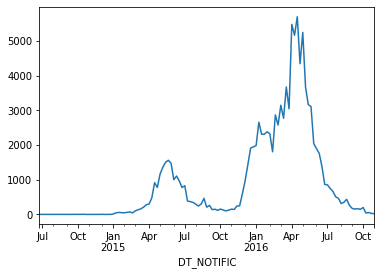

In [51]:
casos.ID_AGRAVO.resample('1W').count().plot();

Suponhamos agora que desejamos visualizar em um mapa os casos que ocorreram, por exemplo entre janeiro e agosto de 2016.

## Usando Kepler.gl para visualização

In [59]:
import keplergl
if os.path.exists('kepler_config.json'):
    config = json.load(open('kepler_config.json','r'))
w1 = keplergl.KeplerGl(height=600, config=config)

User Guide: https://github.com/keplergl/kepler.gl/blob/master/docs/keplergl-jupyter/user-guide.md


In [61]:
w1.add_data(casos[casos.NM_DISEASE=='Zika'].dropna(), name='Casos de Zika em 2016');
w1.add_data(casos[casos.NM_DISEASE=='Dengue'].dropna(), name='Casos de Dengue em 2016');
w1.add_data(casos[casos.NM_DISEASE=='Chikungunya'].dropna(), name='Casos de Chikungunya em 2016');
w1

KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [], 'layers': [{'id': '1h4eais', 'type': …

In [62]:
#Salvando a configuração.
# execute apenas se desejar preservar a configuração atual para sessões futuras.
json.dump(w1.config, open('kepler_config.json','w'))

In [ ]:
w1.